### Observations

| Algorithm   | Time Complexity (Training) | Time Complexity (Query)       | Space Complexity |
|-------------|--------------------------|--------------------------------|------------------|
| **Naive k-NN** | \(O(1)\)                     | \(O(N \* D)\)               | \(O(N * D)\)    |
| **KD-Tree** | \(O(N \* (log N)$^2$)\)       | \(O(D\*S+log N)\)  | \(O(N \* D)\)    |
| **LSH (Locality-Sensitive Hashing)** | \(O(N \* D \* P)\)| \(O( D\*P + (N*D) / 2 $^p$)\)| \(O(N \* P + D * P + N \* D)\) |




For higher dimensions LSH turns out to be a better option that kkd trees because of curse of dimensionality. The fastest algo is kd tree and then lsh and finally naive knn


like this compare and contrast the space and time factors of the three different methods



In [1]:
import numpy as np
import time
import matplotlib.pyplot as plt

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

### Naive KNN

In [43]:
import numpy as np

class KNN_naive:
    def __init__(self, n_neighbors=3):
        self.n_neighbors = n_neighbors

    def fit(self, X, y):
        self.X_train = X
        self.y_train = y

    def euclidean_distances(self, x):
        return np.sqrt(np.sum((self.X_train - x) ** 2, axis=1))

    def neighbours(self, x):
        distances = self.euclidean_distances(x)
        nearest_indices = np.argsort(distances)[:self.n_neighbors]
        return self.X_train[nearest_indices],self.y_train[nearest_indices]
    
    def predict(self, X):
        predictions = []
        for x in X:
            _,neighbours = self.neighbours(x)
            label = np.bincount(neighbours).argmax()
            predictions.append(label)
        return np.array(predictions)


### KD Trees

In [85]:
import numpy as np

class Node:
    def __init__(self, data=None, value=None, left=None, right=None):
        self.data = data
        self.left = left  
        self.right = right
        self.value = value

class Tree:
    def __init__(self, X, y, leaf_size=20):
        self.X = X
        self.y = y
        self.leaf_size = leaf_size

    def build_tree(self, X, y, depth=0):
        if len(X) <= self.leaf_size:
            return Node(data=list([np.array(X),np.array(y)]))
        
        axis = depth % X.shape[1]
        
        sorted_indices = X[:, axis].argsort()
        X_sorted = X[sorted_indices]
        y_sorted = y[sorted_indices]
        
        median_index = len(X_sorted) // 2
        
        node = Node(value=X_sorted[median_index][axis])
        
        node.left = self.build_tree(X_sorted[:median_index], y_sorted[:median_index], depth + 1)
        node.right = self.build_tree(X_sorted[median_index:], y_sorted[median_index:], depth + 1)

        return node

    def fit(self):
        self.tree = self.build_tree(self.X, self.y)



    def find_partition(self, node, x, depth=0):
        if node.left is None and node.right is None and node.value is None:
            return node.data

        axis = depth % x.shape[0]  

        
        x = np.array(x).flatten()
        if axis >= x.shape[0]:
            raise IndexError("Axis index exceeds x dimensions")

        if x[axis] < node.value:
            data = self.find_partition(node.left, x, depth + 1)
        else:
            data = self.find_partition(node.right, x, depth + 1)
        
        return data

class KNN_KD:
    def __init__(self, leaf_size=20, n_neighbors=3):
        self.n_neighbors = n_neighbors
        self.leaf_size = leaf_size
        self.x_partition = None
        self.y_partition = None

    def fit(self, X, y):
        self.X = X
        self.y = y
        self.tree = Tree(X, y, self.leaf_size)
        self.tree.fit()

    def predict(self, X):
        predictions = []
        for x in X:
            _,neighbours = self.neighbours(self.tree.tree,x)
            label = np.bincount(neighbours).argmax()
            predictions.append(label)
        return np.array(predictions)

    def euclidean_distances(self, x):
        return np.sqrt(np.sum((self.x_partition - x) ** 2, axis=1))

    def neighbours(self, node, x):
        self.x_partition,self.y_partition = self.tree.find_partition(node, x)
        distances = self.euclidean_distances(x)
        self.x_partition = np.array(self.x_partition)
        self.y_partition = np.array(self.y_partition)
        # print(distances)
        nearest_indices = np.argsort(distances)[:self.n_neighbors]
        return self.x_partition[nearest_indices],self.y_partition[nearest_indices]


### LSH (Locality Sensitive Hashing)

In [ ]:
import numpy as np

class LSH:
    def __init__(self, n_planes=2, mean=0, std=1, n_neighbours=3):
        self.n_planes = n_planes
        self.mean = mean
        self.std = std
        self.n_neighbours = n_neighbours

    # def list_to_binary(self, lst):
    #     binary_str = ''.join(map(str, lst))
    #     return int(binary_str, 2)

    def fit(self, X, y):
        d = X.shape[1] + 1  
        self.X = np.concatenate([np.ones((X.shape[0], 1)), X], axis=1)
        self.y = y
        
        self.weights = np.random.normal(loc=self.mean, scale=self.std, size=(self.X.shape[1], self.n_planes))
        
        hash_values = np.matmul(self.X, self.weights)
        hash_values = np.where(hash_values > 0, 1, 0)
        self.hash = hash_values
        # print(self.hash)

        self.data_x = {}
        self.data_y = {}
        
        for idx, binary in enumerate(self.hash):
            h = tuple(binary)
            if h not in self.data_x:
                self.data_x[h] = []
                self.data_y[h] = []
            self.data_x[h].append(self.X[idx])  
            self.data_y[h].append(y[idx])

        # print(self.data_x)
        # print(self.data_y)

    def predict(self, X):
        predictions = []
        for x in X:
            _,neighbours = self.neighbours(x)
            label = np.bincount(neighbours).argmax()
            predictions.append(label)
        return np.array(predictions)

    def euclidean_distances(self, x):
        distances = np.sqrt(np.sum((self.x_partition - x) ** 2, axis=1))
        return distances

    def neighbours(self, x):
        x = np.concatenate([np.ones(1), x], axis=0)
        hash_value_x = np.matmul(x, self.weights)
        hash_value_x = np.where(hash_value_x > 0, 1, 0)
        binaryofx = tuple(hash_value_x)
        
        if binaryofx in self.data_x:
            self.x_partition = np.array(self.data_x[binaryofx]) 
            self.y_partition = np.array(self.data_y[binaryofx]) 
        else:
            self.x_partition = self.X  # Already a numpy array
            self.y_partition = self.y  # Already a numpy array

        distances = self.euclidean_distances(x)
        nearest_indices = np.argsort(distances)[:self.n_neighbours]
        return self.x_partition[nearest_indices], self.y_partition[nearest_indices]




### Testing for different N and D

In [5]:
from sklearn.datasets import make_blobs
from sklearn.model_selection import train_test_split
import numpy as np

def createDataset(noise=0.2, d=2, n_clusters=10, test_size=0.2, n_samples=300,random_state=42):
    # Generate the blobs
    X, y = make_blobs(n_samples=n_samples, centers=n_clusters, n_features=d, random_state=random_state)

    np.random.seed(random_state)
    gaussian_noise = np.random.normal(loc=0, scale=noise, size=X.shape)
    
    # Add the Gaussian noise, multiplied by a factor (noise level)
    X_noisy = X + gaussian_noise

    # Split the dataset into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X_noisy, y, test_size=test_size, random_state=random_state)

    return X_train, X_test, y_train, y_test


In [23]:
X_train,X_test,y_train,y_test = createDataset(noise=1,d=10000,n_clusters=3,test_size=0.3,n_samples=5000,random_state = 30)

In [24]:
import time
from memory_profiler import memory_usage
from sklearn.metrics import accuracy_score

def time_memory(func, *args, **kwargs):
    """Tracks memory and time for a given function."""
    start_time = time.time()
    mem_before = memory_usage()[0]
    
    result = func(*args, **kwargs)
    
    mem_after = memory_usage()[0]
    end_time = time.time()
    
    time_elapsed = end_time - start_time
    memory_used = mem_after - mem_before
    
    return result, time_elapsed, memory_used

# Naive k-NN
print("Testing Naive k-NN...")
knn_naive = KNN_naive()
_, fit_time, fit_mem = time_memory(knn_naive.fit, X_train, y_train)
preds, predict_time, predict_mem_naive = time_memory(knn_naive.predict, X_test)
accuracy_naive = accuracy_score(y_test, preds)

print(f"Naive k-NN Accuracy: {accuracy_naive}")
print(f"Fit Time: {fit_time} seconds, Fit Memory: {fit_mem} MiB")
print(f"Predict Time: {predict_time} seconds, Predict Memory: {predict_mem_naive} MiB\n")

# KD-Tree k-NN
print("Testing KD-Tree k-NN...")
knn_kd = KNN_KD()
_, fit_time, fit_mem = time_memory(knn_kd.fit, X_train, y_train)
preds, predict_time, predict_mem = time_memory(knn_kd.predict, X_test)
accuracy = accuracy_score(y_test, preds)

print(f"KD-Tree k-NN Accuracy: {accuracy}")
print(f"Fit Time: {fit_time} seconds, Fit Memory: {fit_mem} MiB")
print(f"Predict Time: {predict_time} seconds, Predict Memory: {predict_mem} MiB\n")

# LSH k-NN
print("Testing LSH k-NN...")
knn_lsh = LSH(n_planes=8)
_, fit_time, fit_mem = time_memory(knn_lsh.fit, X_train, y_train)
preds, predict_time, predict_mem = time_memory(knn_lsh.predict, X_test)
accuracy = accuracy_score(y_test, preds)

print(f"LSH k-NN Accuracy: {accuracy}")
print(f"Fit Time: {fit_time} seconds, Fit Memory: {fit_mem} MiB")
print(f"Predict Time: {predict_time} seconds, Predict Memory: {predict_mem} MiB\n")


Testing Naive k-NN...
Naive k-NN Accuracy: 1.0
Fit Time: 0.20159697532653809 seconds, Fit Memory: 0.0 MiB
Predict Time: 129.80752396583557 seconds, Predict Memory: -0.34375 MiB

Testing KD-Tree k-NN...
KD-Tree k-NN Accuracy: 0.9973333333333333
Fit Time: 0.5208983421325684 seconds, Fit Memory: 187.40625 MiB
Predict Time: 0.42491626739501953 seconds, Predict Memory: 0.0 MiB

Testing LSH k-NN...
LSH k-NN Accuracy: 0.9973333333333333
Fit Time: 0.28090476989746094 seconds, Fit Memory: 267.03125 MiB
Predict Time: 14.290150165557861 seconds, Predict Memory: 0.1328125 MiB



In [25]:
print("Testing LSH k-NN...")
knn_lsh = LSH(n_planes=18)
_, fit_time, fit_mem = time_memory(knn_lsh.fit, X_train, y_train)
preds, predict_time, predict_mem = time_memory(knn_lsh.predict, X_test)
accuracy = accuracy_score(y_test, preds)

print(f"LSH k-NN Accuracy: {accuracy}")
print(f"Fit Time: {fit_time} seconds, Fit Memory: {fit_mem} MiB")
print(f"Predict Time: {predict_time} seconds, Predict Memory: {predict_mem} MiB\n")

Testing LSH k-NN...
LSH k-NN Accuracy: 1.0
Fit Time: 0.3118784427642822 seconds, Fit Memory: 266.9453125 MiB
Predict Time: 11.39989423751831 seconds, Predict Memory: 0.27734375 MiB



In [9]:
! pip install memory-profiler


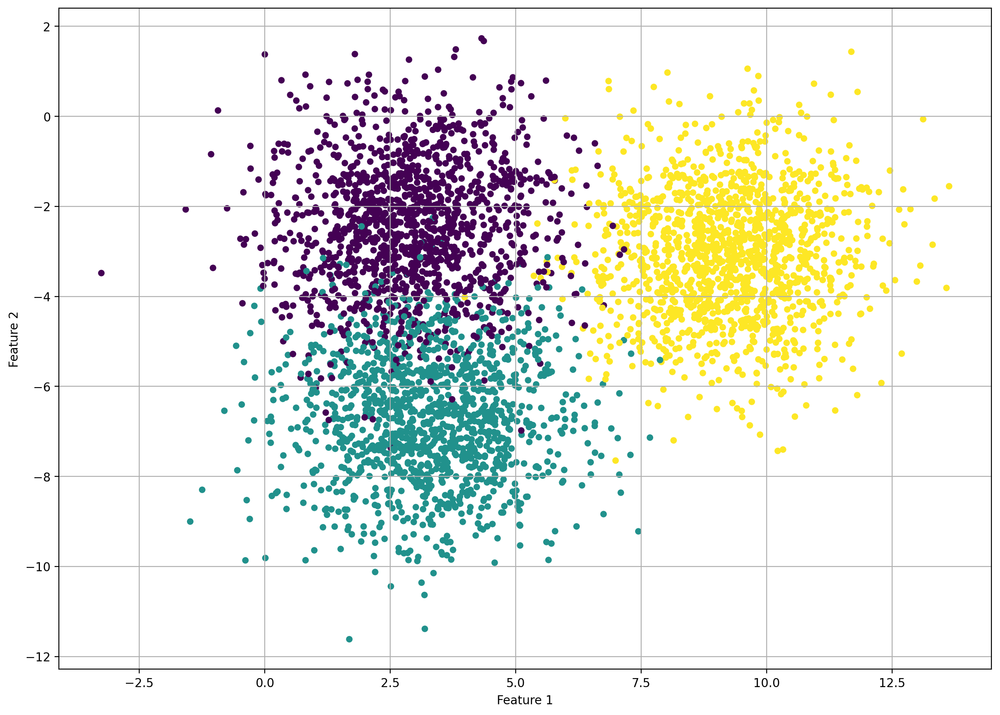

In [10]:
X_train,X_test,y_train,y_test = createDataset(noise=1,d=2,n_clusters=3,test_size=0.6,n_samples=10000,random_state = 30)
plt.figure(figsize=(14,10))
plt.scatter(X_train[:, 0], X_train[:, 1],c=y_train,s=20)
plt.grid()
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()

In [ ]:
# n_samples = [100,1000,2000,5000,10000,20000,30000,50000]
# d_values = [1,5,10,20,30,50,100,500,1000,2000,5000,10000]
# n_planes = [1,2,5,10,15,20,50,100,500,1000,2000,5000,10000]


n_samples = [100,500,1000,5000]
d_values = [1,5,10,50,100,500,1000]
n_planes = [1,5,10,50,100,500]

### Visualization 1.0

d=1	 samples=100	 Training Time: 0.0000 s	 Querying Time: 0.0023 s	 Accuracy: 0.2333
d=1	 samples=500	 Training Time: 0.0000 s	 Querying Time: 0.0079 s	 Accuracy: 0.3600
d=1	 samples=1000	 Training Time: 0.0000 s	 Querying Time: 0.0103 s	 Accuracy: 0.3700
d=1	 samples=5000	 Training Time: 0.0000 s	 Querying Time: 0.1003 s	 Accuracy: 0.3853
d=1	 samples=10000	 Training Time: 0.0000 s	 Querying Time: 0.3666 s	 Accuracy: 0.3850
d=5	 samples=100	 Training Time: 0.0000 s	 Querying Time: 0.0007 s	 Accuracy: 0.9333
d=5	 samples=500	 Training Time: 0.0000 s	 Querying Time: 0.0113 s	 Accuracy: 0.9933
d=5	 samples=1000	 Training Time: 0.0000 s	 Querying Time: 0.0192 s	 Accuracy: 0.9733
d=5	 samples=5000	 Training Time: 0.0000 s	 Querying Time: 0.1832 s	 Accuracy: 0.9807
d=5	 samples=10000	 Training Time: 0.0000 s	 Querying Time: 0.7496 s	 Accuracy: 0.9787
d=10	 samples=100	 Training Time: 0.0000 s	 Querying Time: 0.0006 s	 Accuracy: 1.0000
d=10	 samples=500	 Training Time: 0.0000 s	 Querying Tim

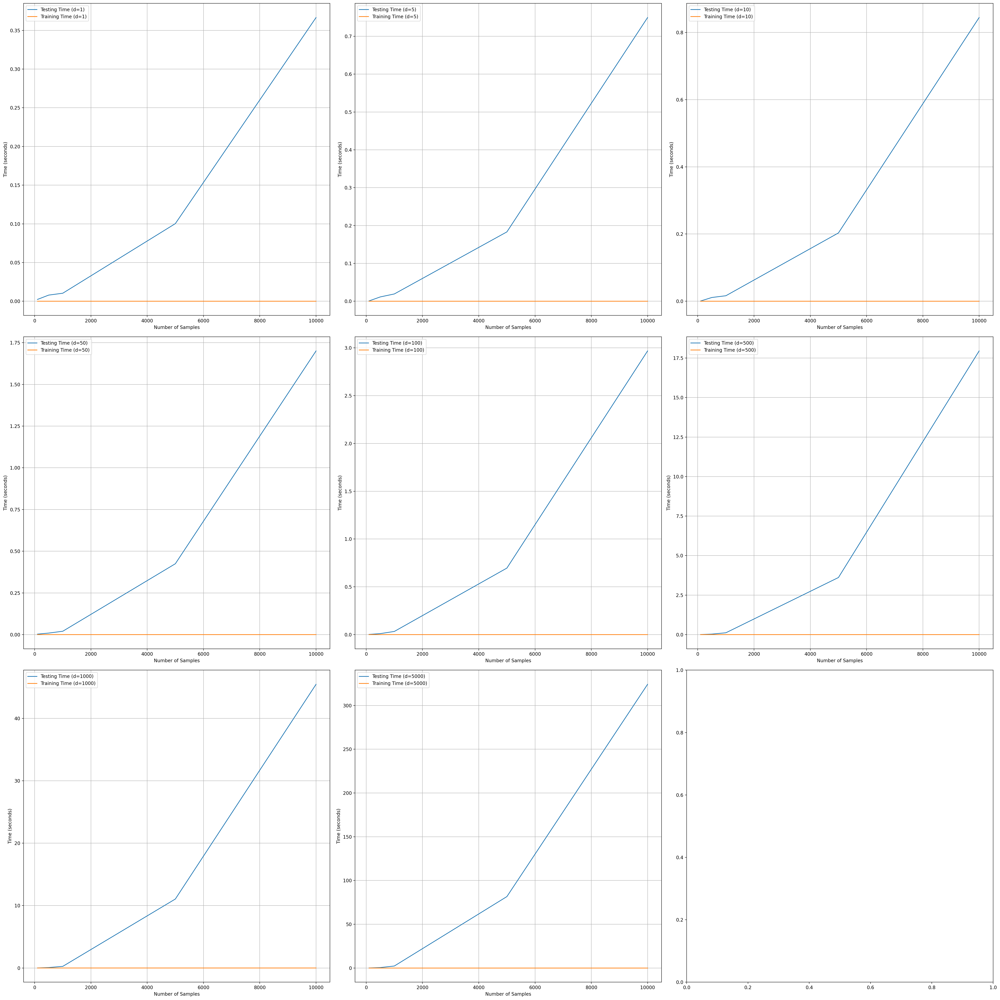

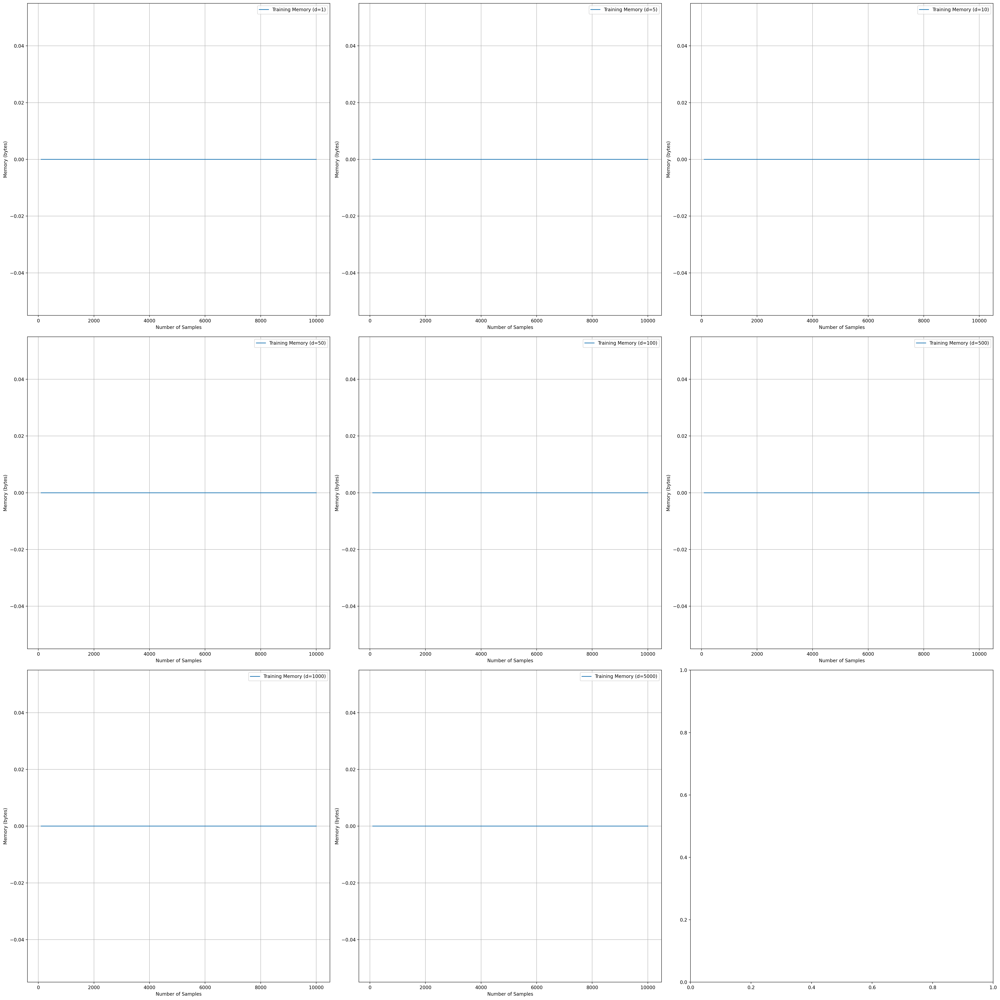

In [ ]:
import time
from memory_profiler import memory_usage
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

def time_memory(func, *args, **kwargs):
    """Tracks memory and time for a given function."""
    mem_before = memory_usage()[0]
    
    start_time = time.time()
    result = func(*args, **kwargs)
    end_time = time.time()
    
    mem_after = memory_usage()[0]
    
    time_elapsed = end_time - start_time
    memory_used = mem_after - mem_before
    
    return result, time_elapsed, memory_used

# Initialize dictionaries for storing time and memory data
test_time_naive = {}
train_time_naive = {}
train_memory_naive = {}

# Iterate over dimension values
for d in d_values:
    temp_test_time = []
    temp_train_time = []
    temp_train_memory = []
    
    # Iterate over the number of samples
    for n_sample in n_samples:
        # Create the dataset
        X_train, X_test, y_train, y_test = createDataset(
            noise=1, d=d, n_clusters=10, test_size=0.3, n_samples=n_sample, random_state=30
        )

        # Initialize KNN model and measure training time and memory
        knn_naive = KNN_naive()
        _, train_time_elapsed, train_memory_used = time_memory(knn_naive.fit, X_train, y_train)
        
        # Measure prediction time and memory
        preds, test_time_elapsed, _ = time_memory(knn_naive.predict, X_test)

        # Compute accuracy
        accuracy = accuracy_score(y_test, preds)
        
        # Record metrics
        temp_train_time.append(train_time_elapsed)
        temp_test_time.append(test_time_elapsed)
        temp_train_memory.append(train_memory_used)

        print(f"d={d}\t samples={n_sample}\t Training Time: {train_time_elapsed:.4f} s\t Querying Time: {test_time_elapsed:.4f} s\t Accuracy: {accuracy:.4f}")
    
    # Store results for the current dimension d
    test_time_naive[d] = temp_test_time
    train_time_naive[d] = temp_train_time
    train_memory_naive[d] = temp_train_memory

# Plotting training and testing times
fig, axes = plt.subplots(len(d_values) // 3 + 1, 3, figsize=(30, 30))
axes = axes.flatten()

for i, d in enumerate(d_values):
    ax = axes[i]
    ax.plot(n_samples, test_time_naive[d], label=f'Testing Time (d={d})')
    ax.plot(n_samples, train_time_naive[d], label=f'Training Time (d={d})')
    ax.set_xlabel("Number of Samples")
    ax.set_ylabel("Time (seconds)")
    ax.grid(True)
    ax.legend()

plt.tight_layout()
plt.show()

# Plotting training memory
fig, axes = plt.subplots(len(d_values) // 3 + 1, 3, figsize=(30, 30))
axes = axes.flatten()

for i, d in enumerate(d_values):
    ax = axes[i]
    ax.plot(n_samples, train_memory_naive[d], label=f'Training Memory (d={d})')
    ax.set_xlabel("Number of Samples")
    ax.set_ylabel("Memory (bytes)")
    ax.grid(True)
    ax.legend()

plt.tight_layout()
plt.show()


d=1	 samples=100	 Training Time: 0.0001 s	 Querying Time: 0.0012 s	 Accuracy: 0.2333
d=1	 samples=500	 Training Time: 0.0010 s	 Querying Time: 0.0010 s	 Accuracy: 0.3600
d=1	 samples=1000	 Training Time: 0.0020 s	 Querying Time: 0.0019 s	 Accuracy: 0.3800
d=1	 samples=5000	 Training Time: 0.0069 s	 Querying Time: 0.0107 s	 Accuracy: 0.3847
d=1	 samples=10000	 Training Time: 0.0072 s	 Querying Time: 0.0202 s	 Accuracy: 0.3903
d=5	 samples=100	 Training Time: 0.0003 s	 Querying Time: 0.0003 s	 Accuracy: 0.8667
d=5	 samples=500	 Training Time: 0.0009 s	 Querying Time: 0.0010 s	 Accuracy: 0.9200
d=5	 samples=1000	 Training Time: 0.0016 s	 Querying Time: 0.0020 s	 Accuracy: 0.9433
d=5	 samples=5000	 Training Time: 0.0088 s	 Querying Time: 0.0132 s	 Accuracy: 0.9627
d=5	 samples=10000	 Training Time: 0.0073 s	 Querying Time: 0.0217 s	 Accuracy: 0.9700
d=10	 samples=100	 Training Time: 0.0003 s	 Querying Time: 0.0003 s	 Accuracy: 0.9000
d=10	 samples=500	 Training Time: 0.0011 s	 Querying Tim

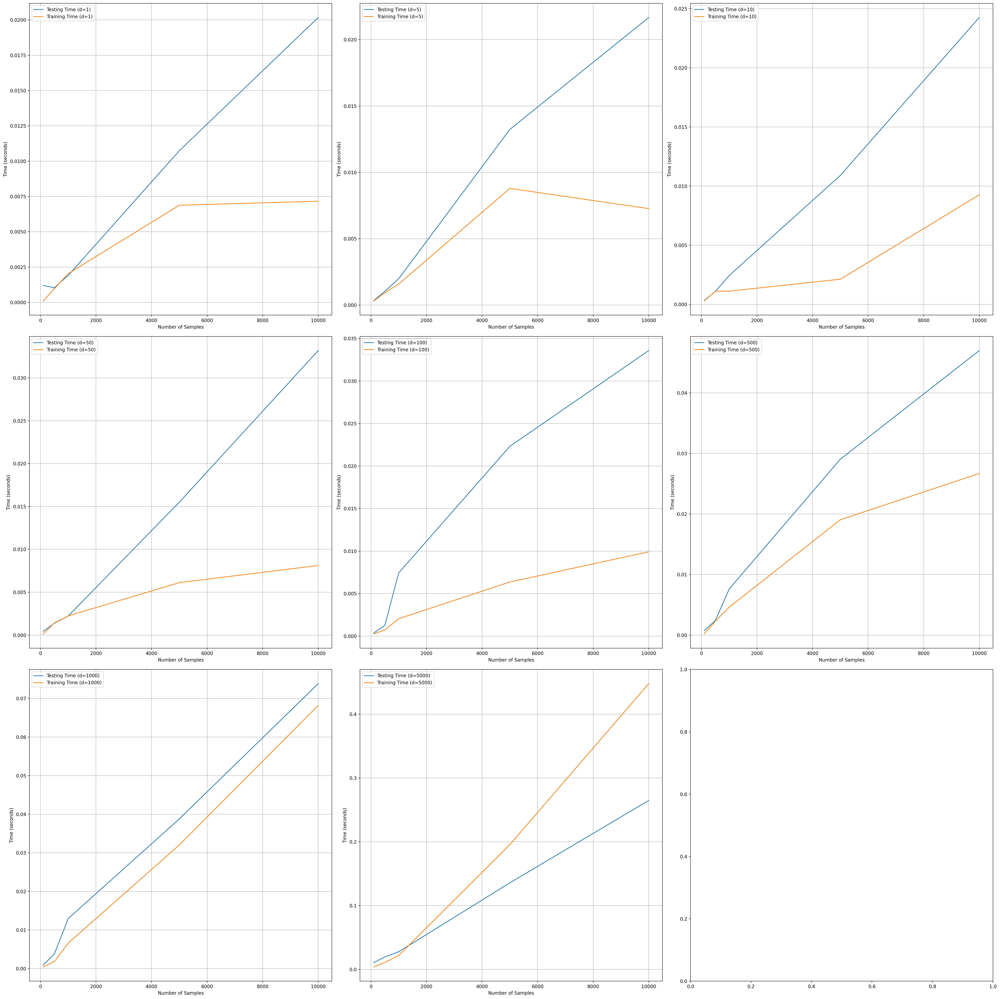

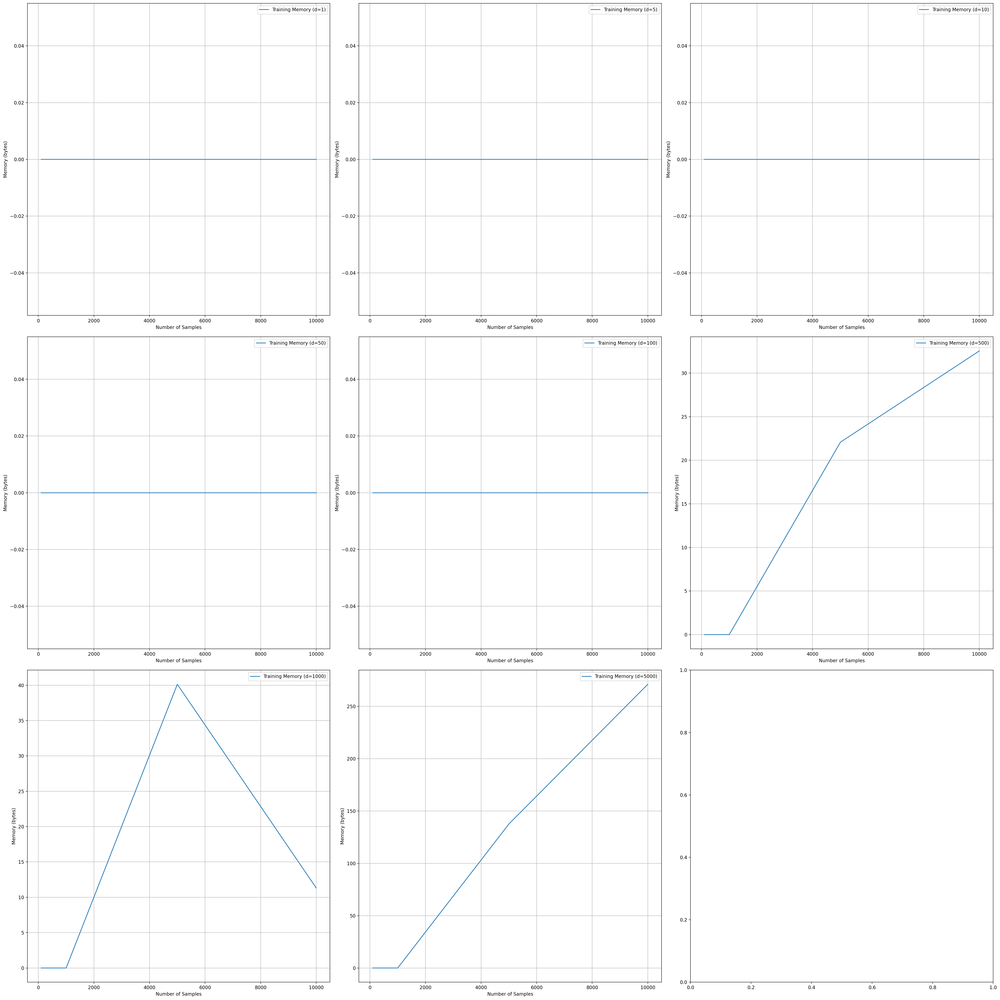

In [ ]:
import time
from memory_profiler import memory_usage
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score


def time_memory(func, *args, **kwargs):
    """Tracks memory and time for a given function."""
    mem_before = memory_usage()[0]
    # print(mem_before)
    
    start_time = time.time()
    result = func(*args, **kwargs)
    end_time = time.time()
    
    mem_after = memory_usage()[0]
    # print(mem_after)
    time_elapsed = end_time - start_time
    memory_used = mem_after - mem_before
    
    return result, time_elapsed, memory_used

# Initialize dictionaries for storing time and memory data
test_time_kd = {}
train_time_kd = {}
train_memory_kd = {}

# Iterate over dimension values
for d in d_values:
    temp_test_time = []
    temp_train_time = []
    temp_train_memory = []
    
    # Iterate over the number of samples
    for n_sample in n_samples:
        time.sleep(1)
        # Create the dataset
        X_train, X_test, y_train, y_test = createDataset(
            noise=1, d=d, n_clusters=10, test_size=0.3, n_samples=n_sample, random_state=30
        )

        # Initialize KNN model and measure training time and memory
        knn_kd = KNN_KD()
        _, train_time_elapsed, train_memory_used = time_memory(knn_kd.fit, X_train, y_train)
        
        # Measure prediction time and memory
        preds, test_time_elapsed, _ = time_memory(knn_kd.predict, X_test)

        # Compute accuracy
        accuracy = accuracy_score(y_test, preds)


        # print(train_memory_used)
        
        # Record metrics
        temp_train_time.append(train_time_elapsed)
        temp_test_time.append(test_time_elapsed)
        temp_train_memory.append(train_memory_used)

        print(f"d={d}\t samples={n_sample}\t Training Time: {train_time_elapsed:.4f} s\t Querying Time: {test_time_elapsed:.4f} s\t Accuracy: {accuracy:.4f}")
    
    # Store results for the current dimension d
    test_time_kd[d] = temp_test_time
    train_time_kd[d] = temp_train_time
    train_memory_kd[d] = temp_train_memory

# Plotting training and testing times
fig, axes = plt.subplots(len(d_values) // 3 + 1, 3, figsize=(30, 30))
axes = axes.flatten()

for i, d in enumerate(d_values):
    ax = axes[i]
    ax.plot(n_samples, test_time_kd[d], label=f'Testing Time (d={d})')
    ax.plot(n_samples, train_time_kd[d], label=f'Training Time (d={d})')
    ax.set_xlabel("Number of Samples")
    ax.set_ylabel("Time (seconds)")
    ax.grid(True)
    ax.legend()

plt.tight_layout()
plt.show()

# Plotting training memory
fig, axes = plt.subplots(len(d_values) // 3 + 1, 3, figsize=(30, 30))
axes = axes.flatten()

for i, d in enumerate(d_values):
    ax = axes[i]
    ax.plot(n_samples, train_memory_kd[d], label=f'Training Memory (d={d})')
    ax.set_xlabel("Number of Samples")
    ax.set_ylabel("Memory (bytes)")
    ax.grid(True)
    ax.legend()

plt.tight_layout()
plt.show()


planes=1	d=1	samples=100	Training Time: 0.0003 s	 Querying Time: 0.0037 s	 Accuracy: 0.2333
planes=1	d=1	samples=500	Training Time: 0.0030 s	 Querying Time: 0.0092 s	 Accuracy: 0.3600
planes=1	d=1	samples=1000	Training Time: 0.0020 s	 Querying Time: 0.0280 s	 Accuracy: 0.3700
planes=1	d=1	samples=5000	Training Time: 0.0110 s	 Querying Time: 0.4573 s	 Accuracy: 0.3853
planes=1	d=1	samples=10000	Training Time: 0.0149 s	 Querying Time: 1.8496 s	 Accuracy: 0.3850
planes=1	d=5	samples=100	Training Time: 0.0010 s	 Querying Time: 0.0009 s	 Accuracy: 0.9000
planes=1	d=5	samples=500	Training Time: 0.0029 s	 Querying Time: 0.0079 s	 Accuracy: 0.9933
planes=1	d=5	samples=1000	Training Time: 0.0041 s	 Querying Time: 0.0301 s	 Accuracy: 0.9733
planes=1	d=5	samples=5000	Training Time: 0.0052 s	 Querying Time: 0.5096 s	 Accuracy: 0.9800
planes=1	d=5	samples=10000	Training Time: 0.0147 s	 Querying Time: 2.1510 s	 Accuracy: 0.9787
planes=1	d=10	samples=100	Training Time: 0.0009 s	 Querying Time: 0.0043

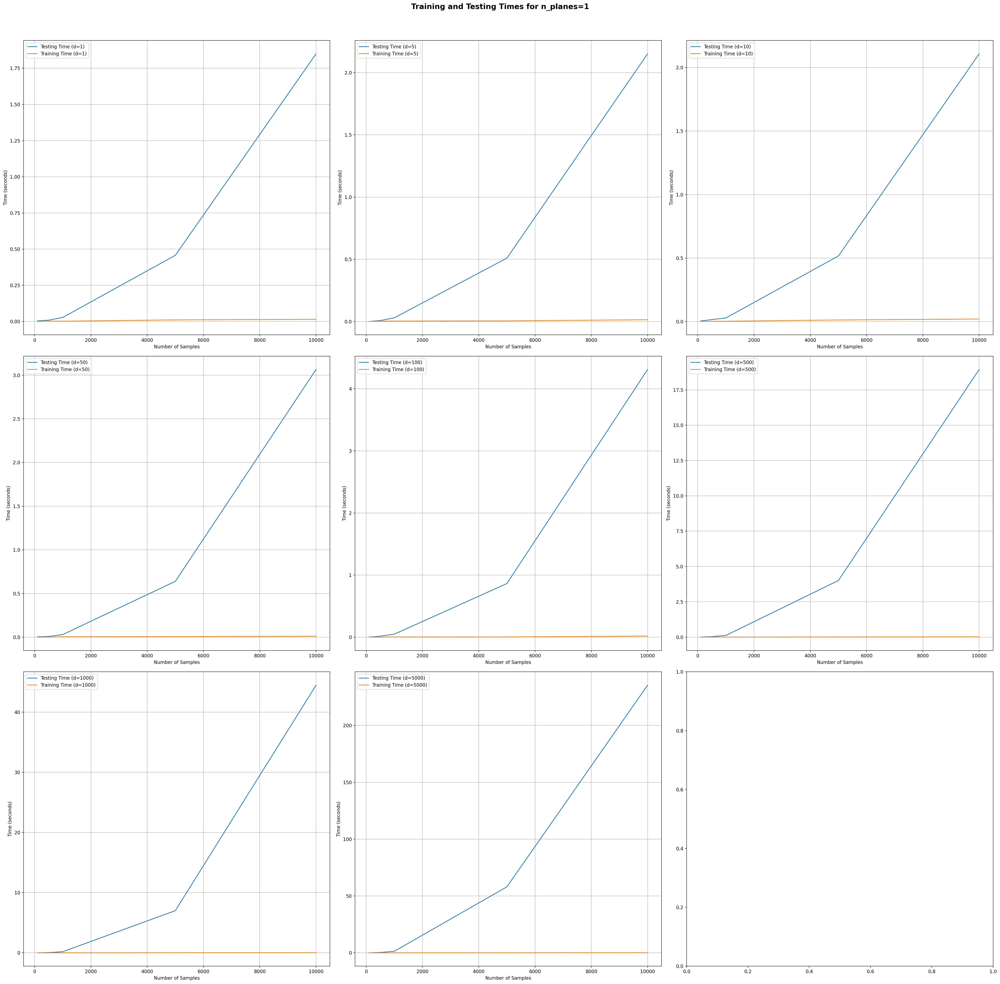

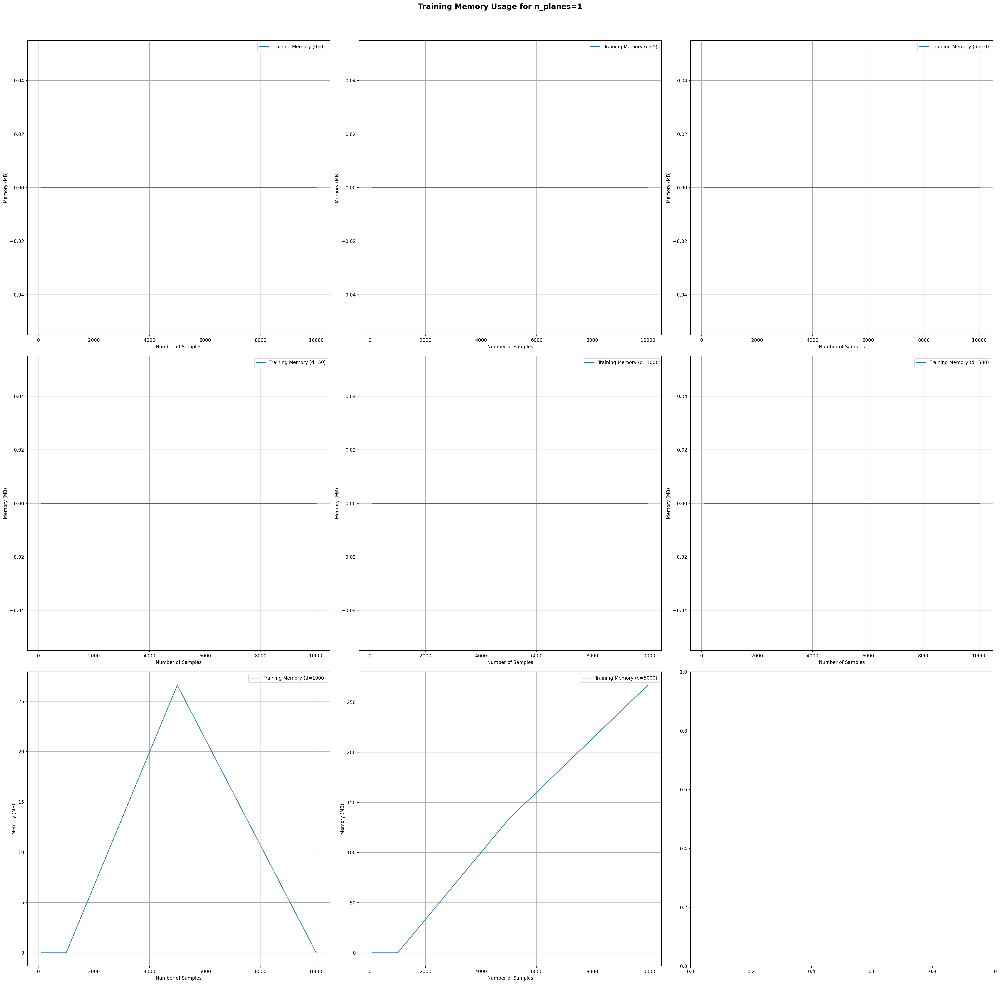

planes=5	d=1	samples=100	Training Time: 0.0005 s	 Querying Time: 0.0013 s	 Accuracy: 0.2667
planes=5	d=1	samples=500	Training Time: 0.0018 s	 Querying Time: 0.0083 s	 Accuracy: 0.3733
planes=5	d=1	samples=1000	Training Time: 0.0039 s	 Querying Time: 0.0209 s	 Accuracy: 0.3700
planes=5	d=1	samples=5000	Training Time: 0.0074 s	 Querying Time: 0.3394 s	 Accuracy: 0.3847
planes=5	d=1	samples=10000	Training Time: 0.0109 s	 Querying Time: 1.4715 s	 Accuracy: 0.3850
planes=5	d=5	samples=100	Training Time: 0.0008 s	 Querying Time: 0.0019 s	 Accuracy: 0.8667
planes=5	d=5	samples=500	Training Time: 0.0037 s	 Querying Time: 0.0061 s	 Accuracy: 0.9733
planes=5	d=5	samples=1000	Training Time: 0.0034 s	 Querying Time: 0.0107 s	 Accuracy: 0.9600
planes=5	d=5	samples=5000	Training Time: 0.0101 s	 Querying Time: 0.1337 s	 Accuracy: 0.9753
planes=5	d=5	samples=10000	Training Time: 0.0112 s	 Querying Time: 0.5129 s	 Accuracy: 0.9747
planes=5	d=10	samples=100	Training Time: 0.0006 s	 Querying Time: 0.0033

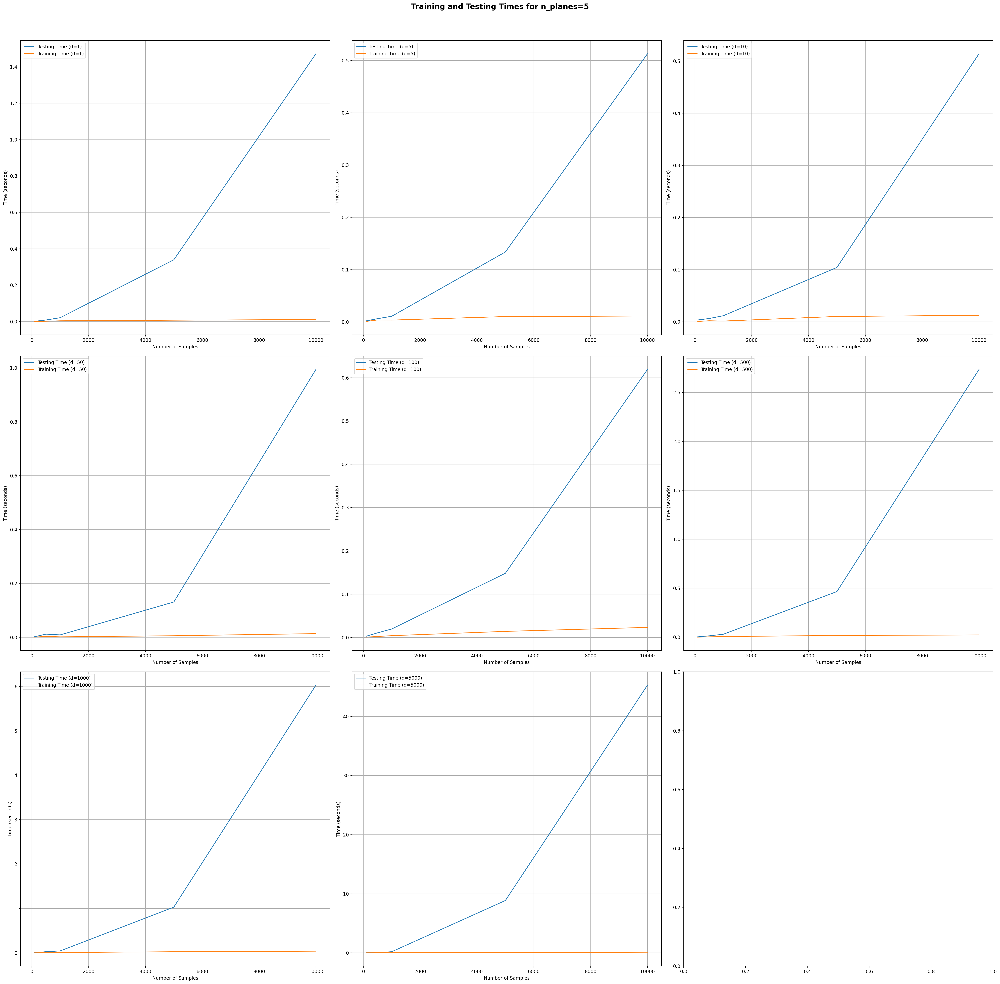

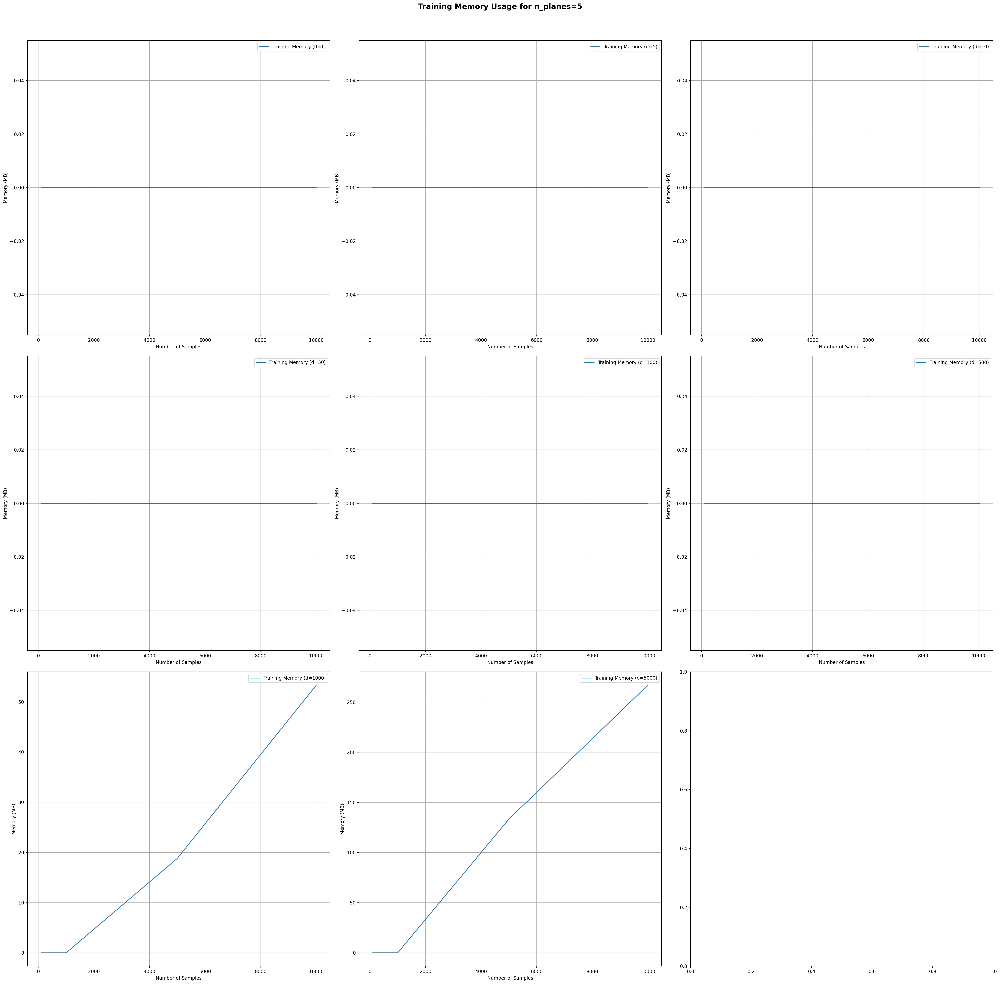

planes=10	d=1	samples=100	Training Time: 0.0017 s	 Querying Time: 0.0024 s	 Accuracy: 0.2333
planes=10	d=1	samples=500	Training Time: 0.0042 s	 Querying Time: 0.0108 s	 Accuracy: 0.3600
planes=10	d=1	samples=1000	Training Time: 0.0057 s	 Querying Time: 0.0311 s	 Accuracy: 0.3700
planes=10	d=1	samples=5000	Training Time: 0.0152 s	 Querying Time: 0.3047 s	 Accuracy: 0.3853
planes=10	d=1	samples=10000	Training Time: 0.0192 s	 Querying Time: 1.0140 s	 Accuracy: 0.3853
planes=10	d=5	samples=100	Training Time: 0.0013 s	 Querying Time: 0.0028 s	 Accuracy: 0.8333
planes=10	d=5	samples=500	Training Time: 0.0032 s	 Querying Time: 0.0079 s	 Accuracy: 0.9800
planes=10	d=5	samples=1000	Training Time: 0.0066 s	 Querying Time: 0.0142 s	 Accuracy: 0.9500
planes=10	d=5	samples=5000	Training Time: 0.0155 s	 Querying Time: 0.0620 s	 Accuracy: 0.9820
planes=10	d=5	samples=10000	Training Time: 0.0199 s	 Querying Time: 0.2274 s	 Accuracy: 0.9707
planes=10	d=10	samples=100	Training Time: 0.0010 s	 Querying T

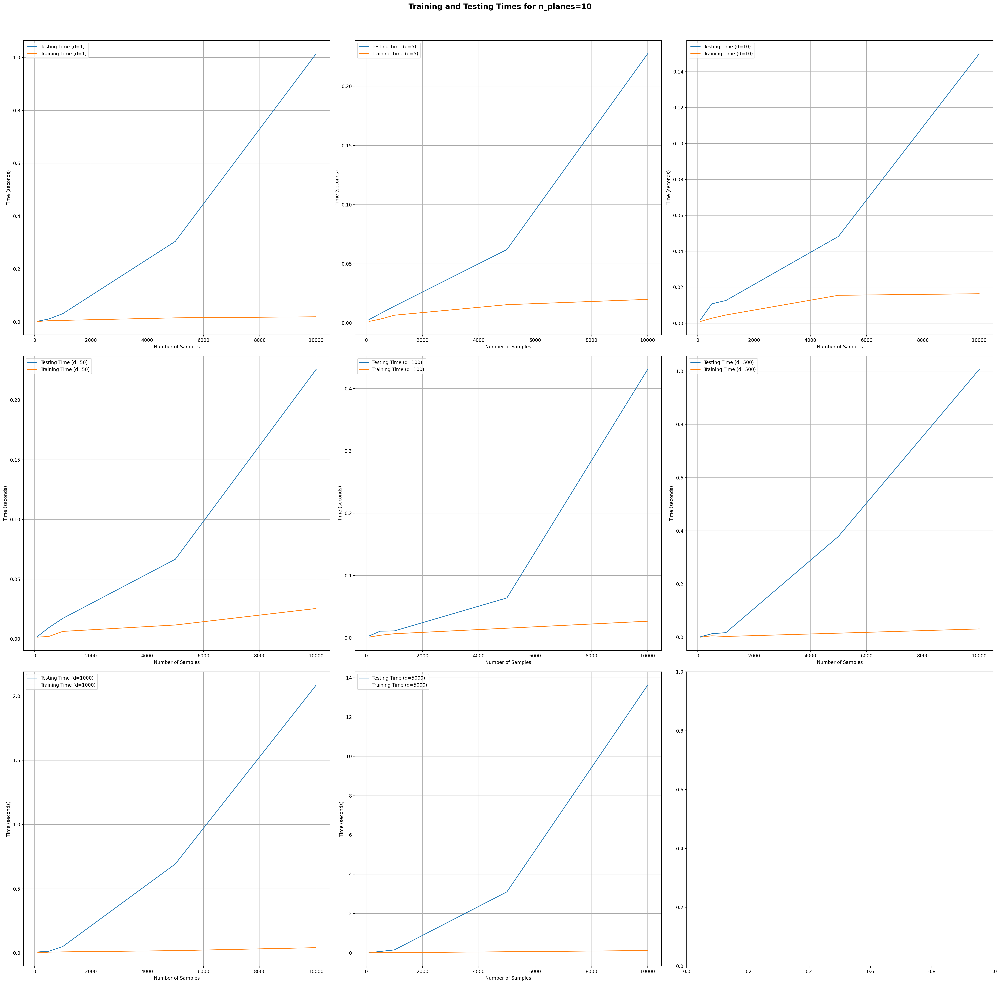

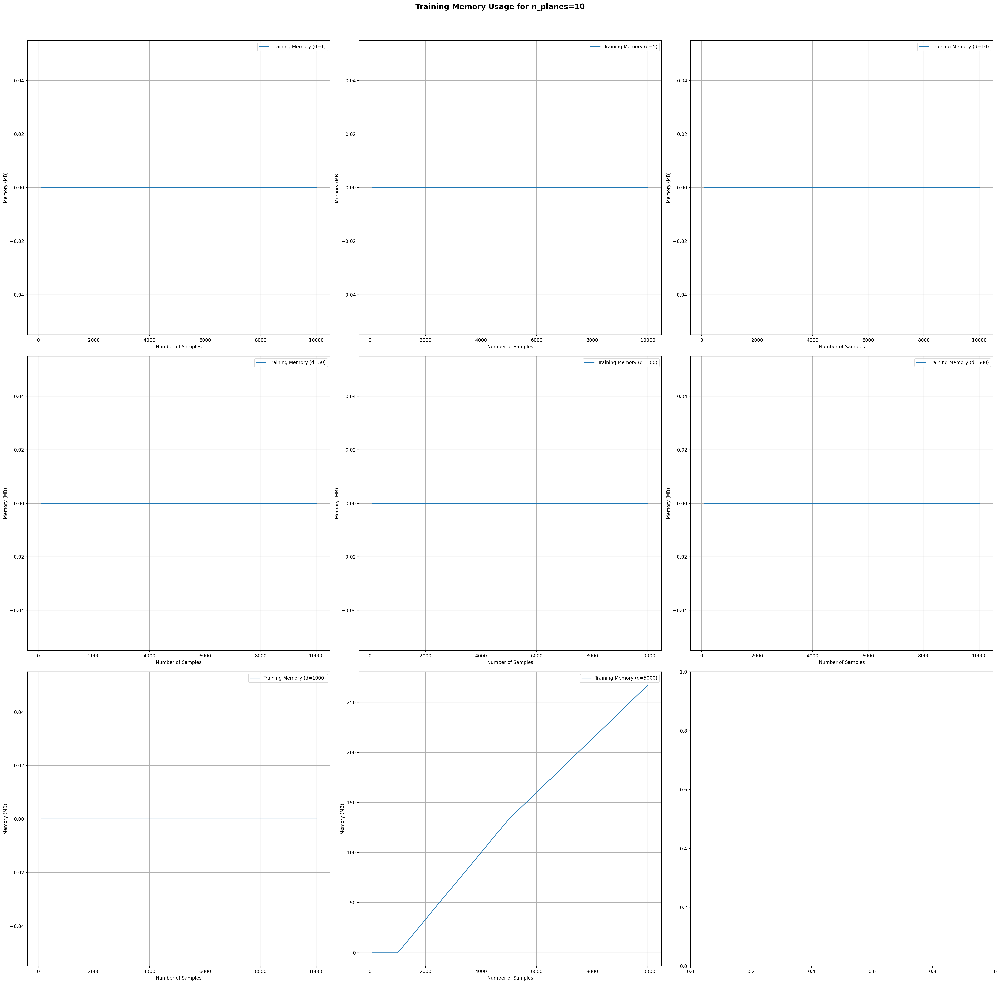

planes=50	d=1	samples=100	Training Time: 0.0006 s	 Querying Time: 0.0011 s	 Accuracy: 0.2000
planes=50	d=1	samples=500	Training Time: 0.0060 s	 Querying Time: 0.0099 s	 Accuracy: 0.3733
planes=50	d=1	samples=1000	Training Time: 0.0118 s	 Querying Time: 0.0073 s	 Accuracy: 0.3800
planes=50	d=1	samples=5000	Training Time: 0.0233 s	 Querying Time: 0.1090 s	 Accuracy: 0.3853
planes=50	d=1	samples=10000	Training Time: 0.0390 s	 Querying Time: 0.6618 s	 Accuracy: 0.3840
planes=50	d=5	samples=100	Training Time: 0.0008 s	 Querying Time: 0.0028 s	 Accuracy: 0.9333
planes=50	d=5	samples=500	Training Time: 0.0020 s	 Querying Time: 0.0111 s	 Accuracy: 0.9867
planes=50	d=5	samples=1000	Training Time: 0.0030 s	 Querying Time: 0.0153 s	 Accuracy: 0.9733
planes=50	d=5	samples=5000	Training Time: 0.0200 s	 Querying Time: 0.0969 s	 Accuracy: 0.9787
planes=50	d=5	samples=10000	Training Time: 0.0352 s	 Querying Time: 0.2193 s	 Accuracy: 0.9747
planes=50	d=10	samples=100	Training Time: 0.0020 s	 Querying T

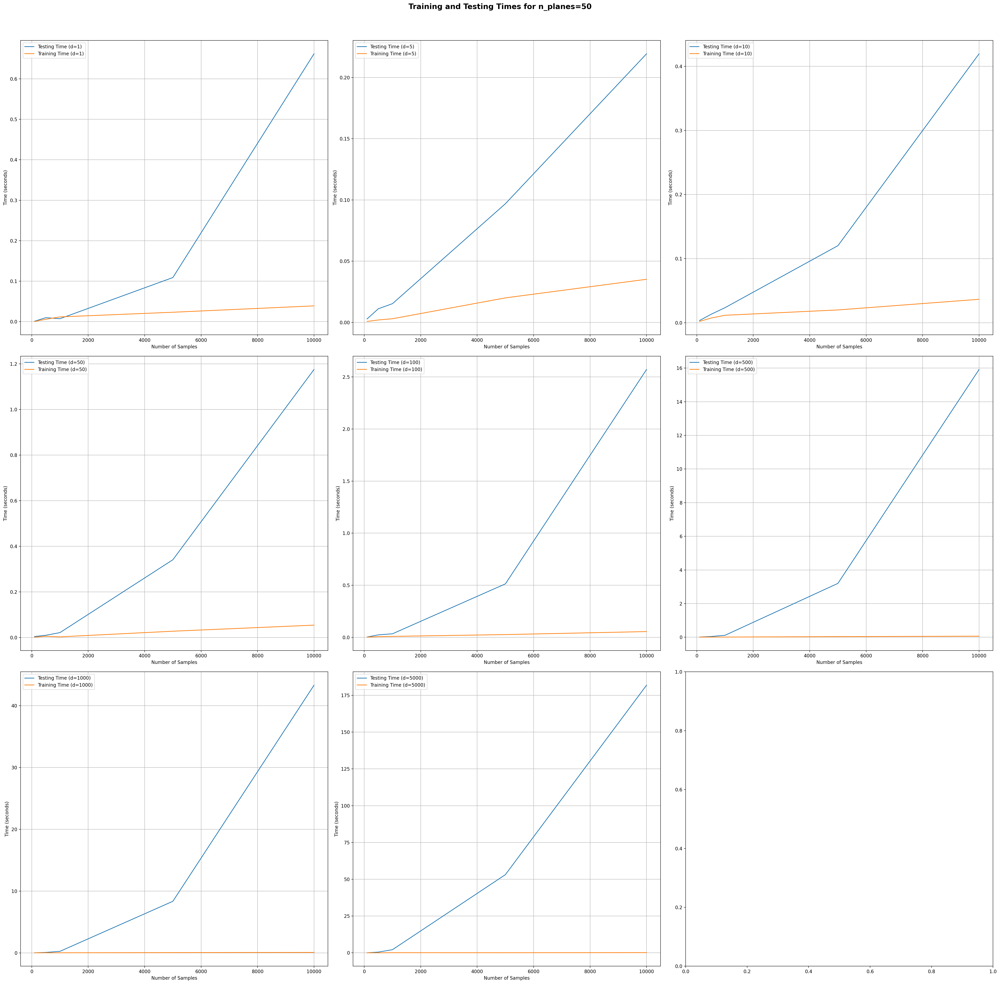

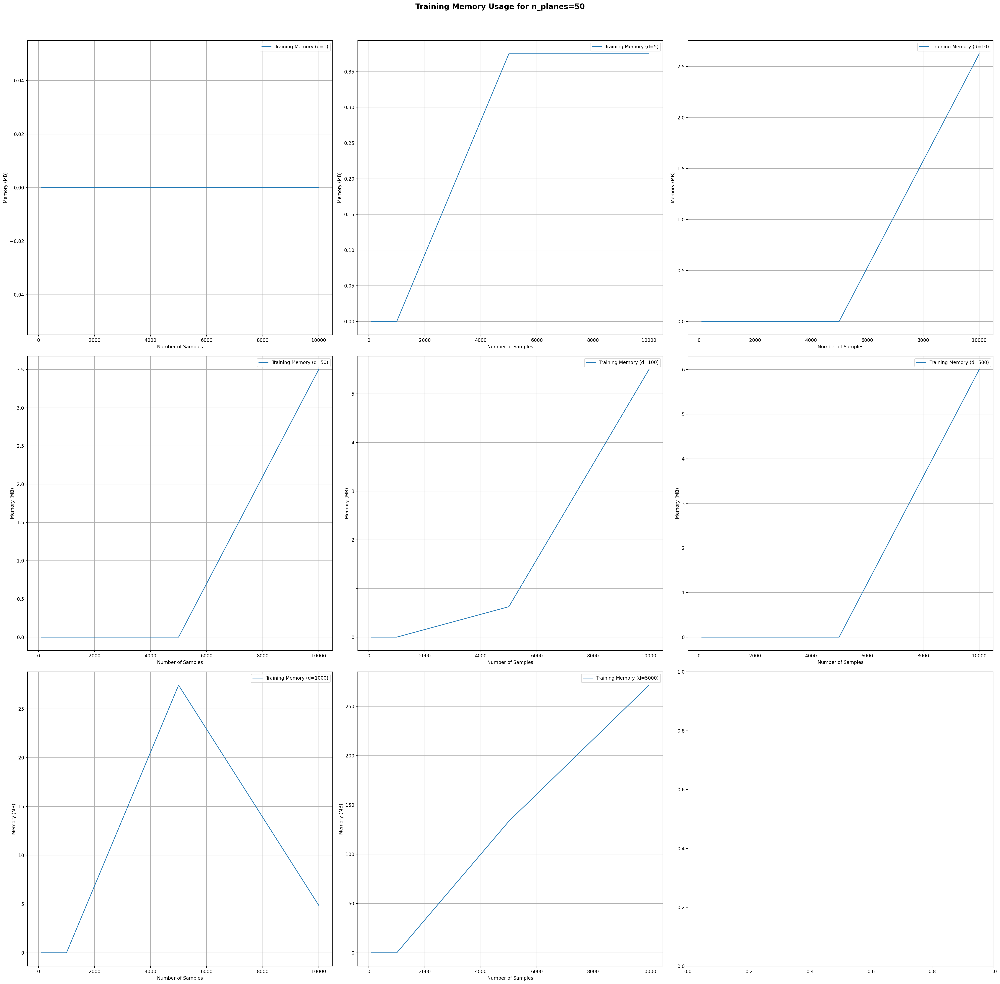

planes=100	d=1	samples=100	Training Time: 0.0008 s	 Querying Time: 0.0010 s	 Accuracy: 0.2333
planes=100	d=1	samples=500	Training Time: 0.0077 s	 Querying Time: 0.0051 s	 Accuracy: 0.3867
planes=100	d=1	samples=1000	Training Time: 0.0151 s	 Querying Time: 0.0107 s	 Accuracy: 0.3767
planes=100	d=1	samples=5000	Training Time: 0.0338 s	 Querying Time: 0.0991 s	 Accuracy: 0.3793
planes=100	d=1	samples=10000	Training Time: 0.0635 s	 Querying Time: 0.2633 s	 Accuracy: 0.3863
planes=100	d=5	samples=100	Training Time: 0.0033 s	 Querying Time: 0.0028 s	 Accuracy: 0.9333
planes=100	d=5	samples=500	Training Time: 0.0098 s	 Querying Time: 0.0080 s	 Accuracy: 0.9933
planes=100	d=5	samples=1000	Training Time: 0.0138 s	 Querying Time: 0.0105 s	 Accuracy: 0.9733
planes=100	d=5	samples=5000	Training Time: 0.0291 s	 Querying Time: 0.1611 s	 Accuracy: 0.9793
planes=100	d=5	samples=10000	Training Time: 0.0951 s	 Querying Time: 0.4450 s	 Accuracy: 0.9767
planes=100	d=10	samples=100	Training Time: 0.0028 s	

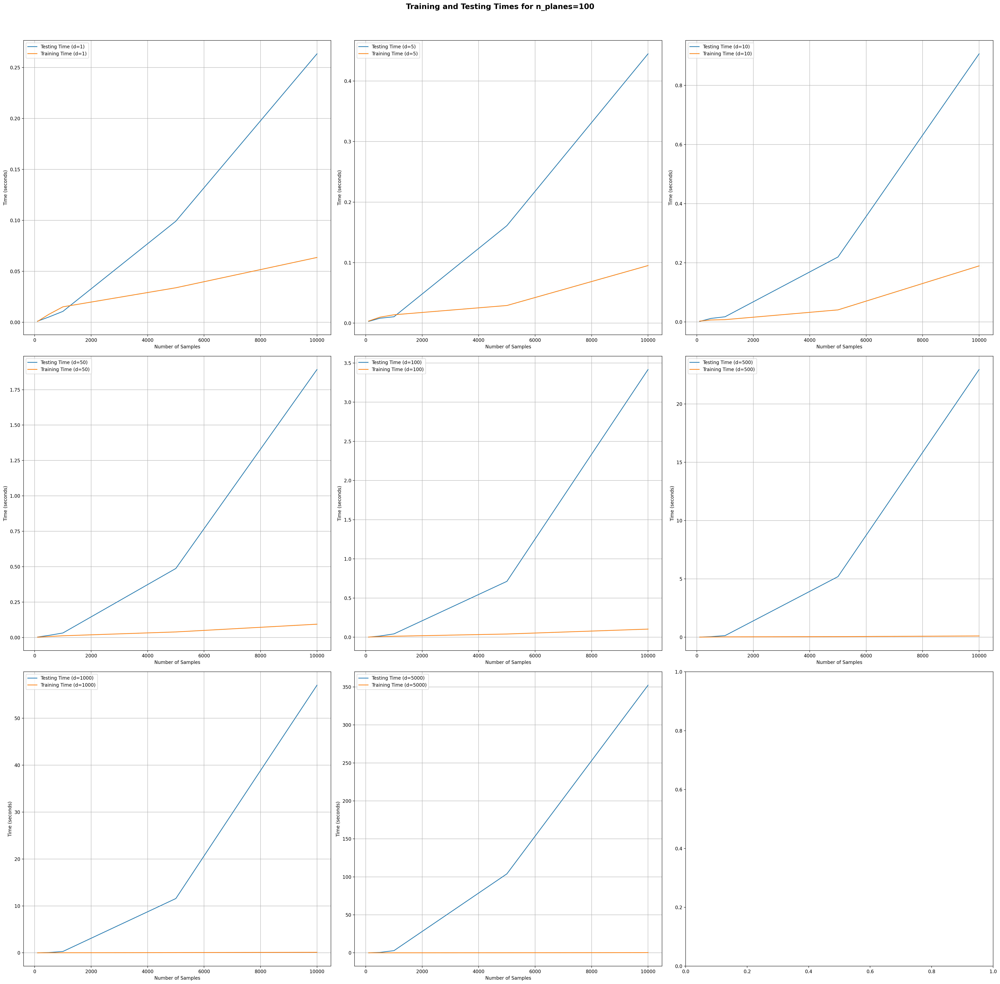

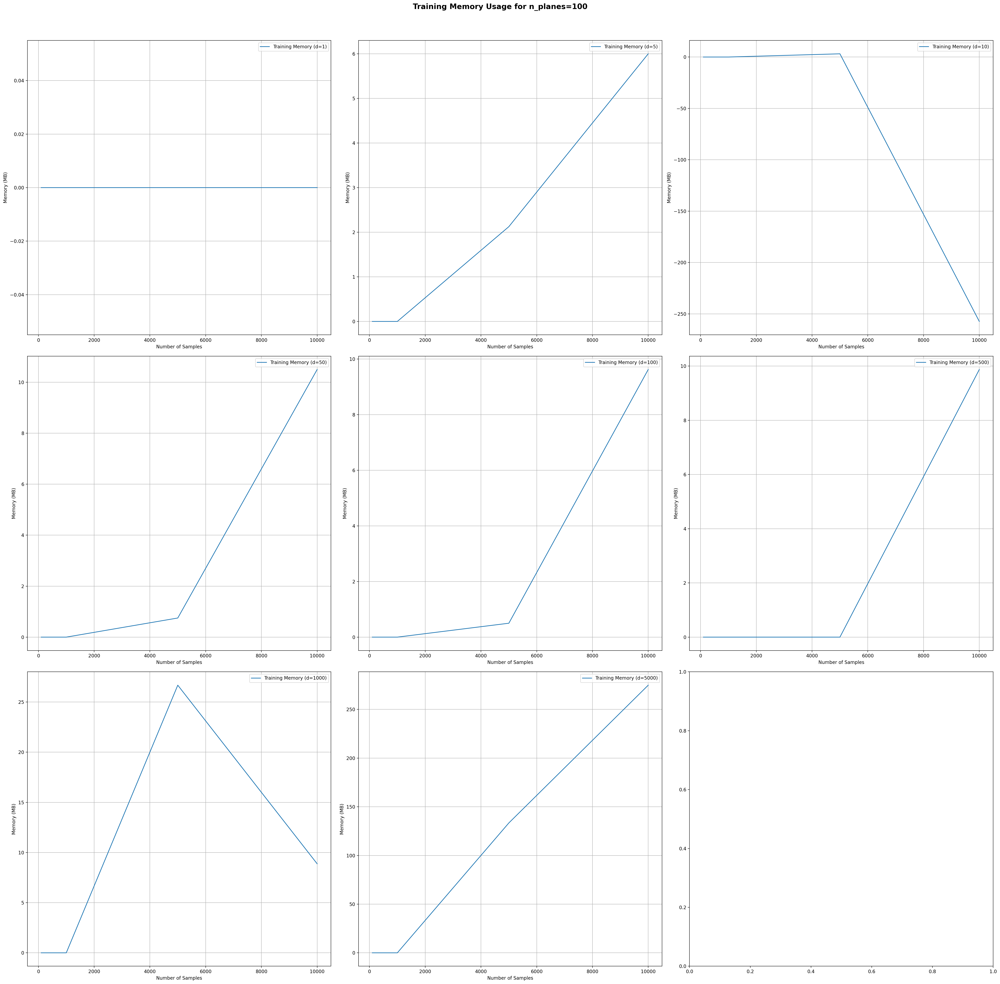

planes=500	d=1	samples=100	Training Time: 0.0084 s	 Querying Time: 0.0050 s	 Accuracy: 0.2000
planes=500	d=1	samples=500	Training Time: 0.0136 s	 Querying Time: 0.0160 s	 Accuracy: 0.3733
planes=500	d=1	samples=1000	Training Time: 0.0266 s	 Querying Time: 0.0183 s	 Accuracy: 0.4100
planes=500	d=1	samples=5000	Training Time: 0.1653 s	 Querying Time: 0.0971 s	 Accuracy: 0.3800
planes=500	d=1	samples=10000	Training Time: 0.3066 s	 Querying Time: 0.2299 s	 Accuracy: 0.3853
planes=500	d=5	samples=100	Training Time: 0.0083 s	 Querying Time: 0.0044 s	 Accuracy: 0.9333
planes=500	d=5	samples=500	Training Time: 0.0145 s	 Querying Time: 0.0096 s	 Accuracy: 0.9933
planes=500	d=5	samples=1000	Training Time: 0.0243 s	 Querying Time: 0.0195 s	 Accuracy: 0.9733
planes=500	d=5	samples=5000	Training Time: 0.1410 s	 Querying Time: 0.2235 s	 Accuracy: 0.9807
planes=500	d=5	samples=10000	Training Time: 0.3535 s	 Querying Time: 0.8593 s	 Accuracy: 0.9787
planes=500	d=10	samples=100	Training Time: 0.0094 s	

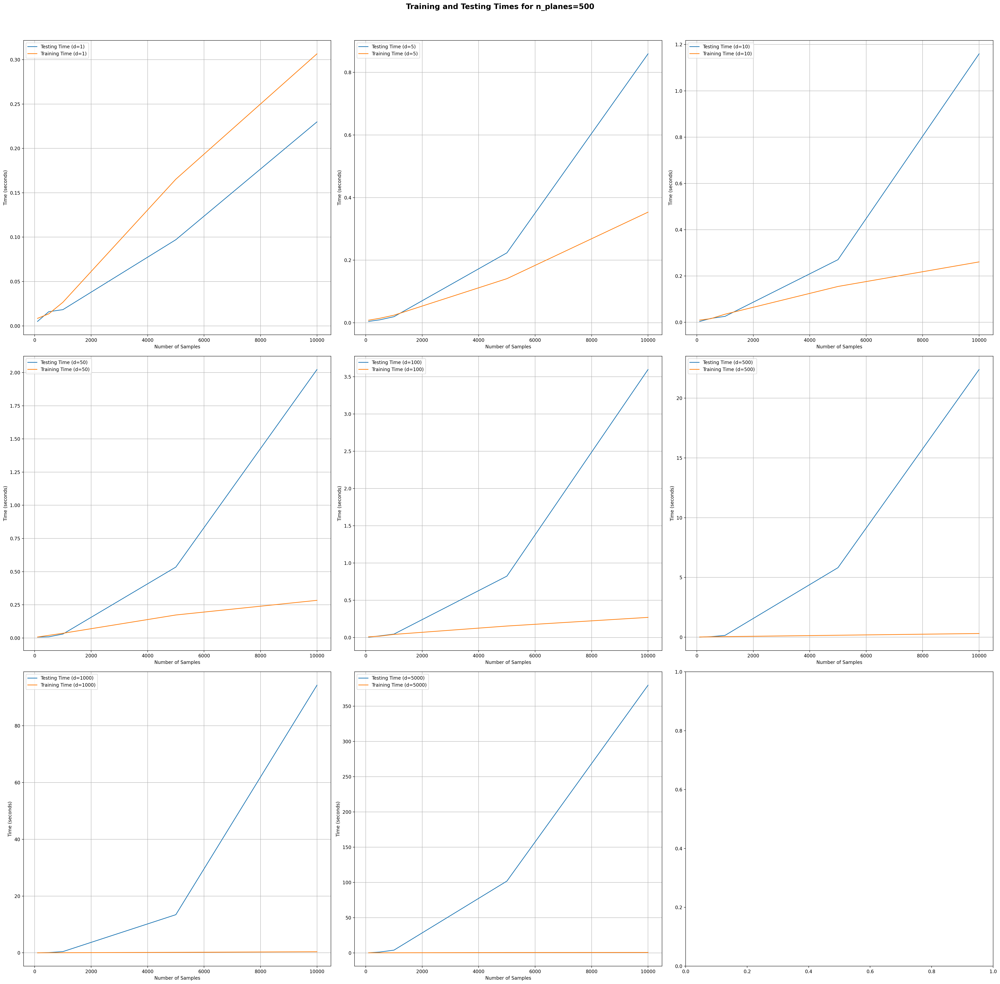

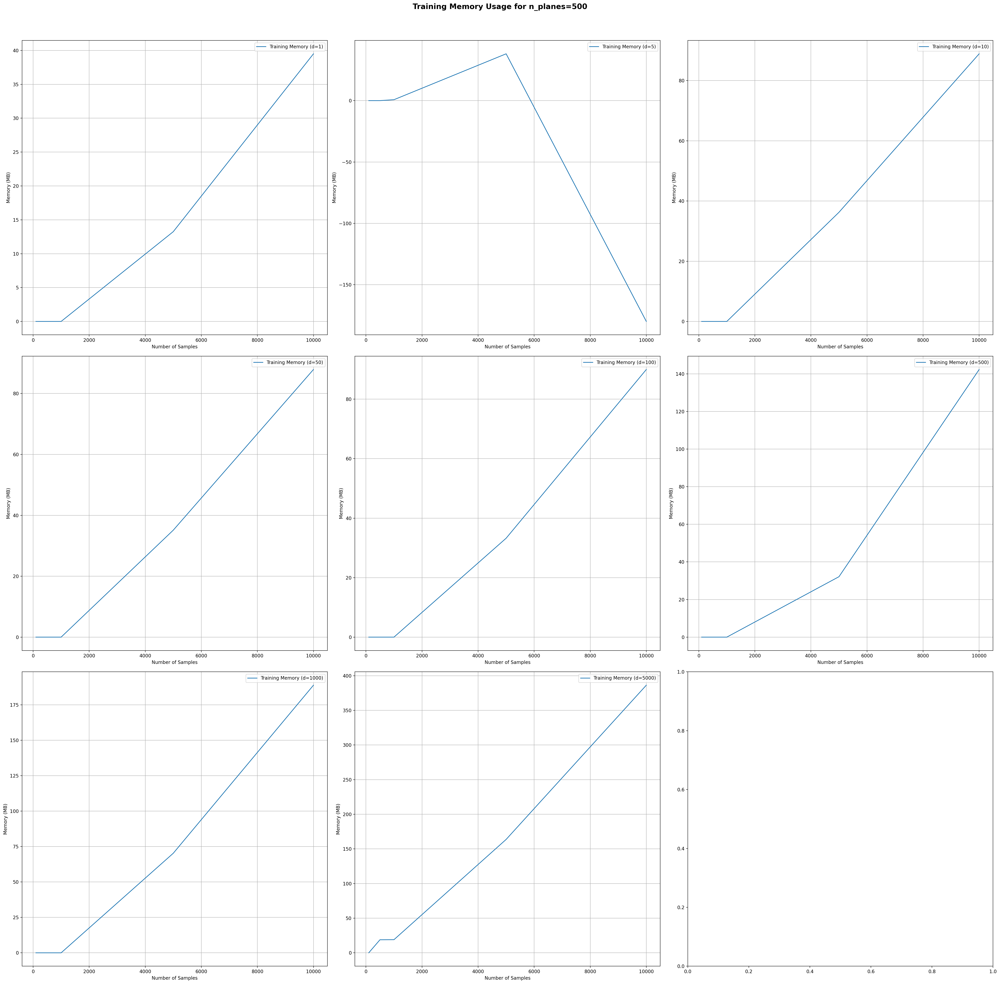

planes=1000	d=1	samples=100	Training Time: 0.0039 s	 Querying Time: 0.0052 s	 Accuracy: 0.3000
planes=1000	d=1	samples=500	Training Time: 0.0205 s	 Querying Time: 0.0175 s	 Accuracy: 0.3667
planes=1000	d=1	samples=1000	Training Time: 0.0477 s	 Querying Time: 0.0264 s	 Accuracy: 0.4067
planes=1000	d=1	samples=5000	Training Time: 0.3014 s	 Querying Time: 0.1534 s	 Accuracy: 0.3907
planes=1000	d=1	samples=10000	Training Time: 0.5604 s	 Querying Time: 0.3150 s	 Accuracy: 0.3847
planes=1000	d=5	samples=100	Training Time: 0.0086 s	 Querying Time: 0.0031 s	 Accuracy: 0.9333
planes=1000	d=5	samples=500	Training Time: 0.0241 s	 Querying Time: 0.0154 s	 Accuracy: 0.9933
planes=1000	d=5	samples=1000	Training Time: 0.0601 s	 Querying Time: 0.0277 s	 Accuracy: 0.9733
planes=1000	d=5	samples=5000	Training Time: 0.3249 s	 Querying Time: 0.2600 s	 Accuracy: 0.9807
planes=1000	d=5	samples=10000	Training Time: 0.4794 s	 Querying Time: 0.9186 s	 Accuracy: 0.9787
planes=1000	d=10	samples=100	Training Time

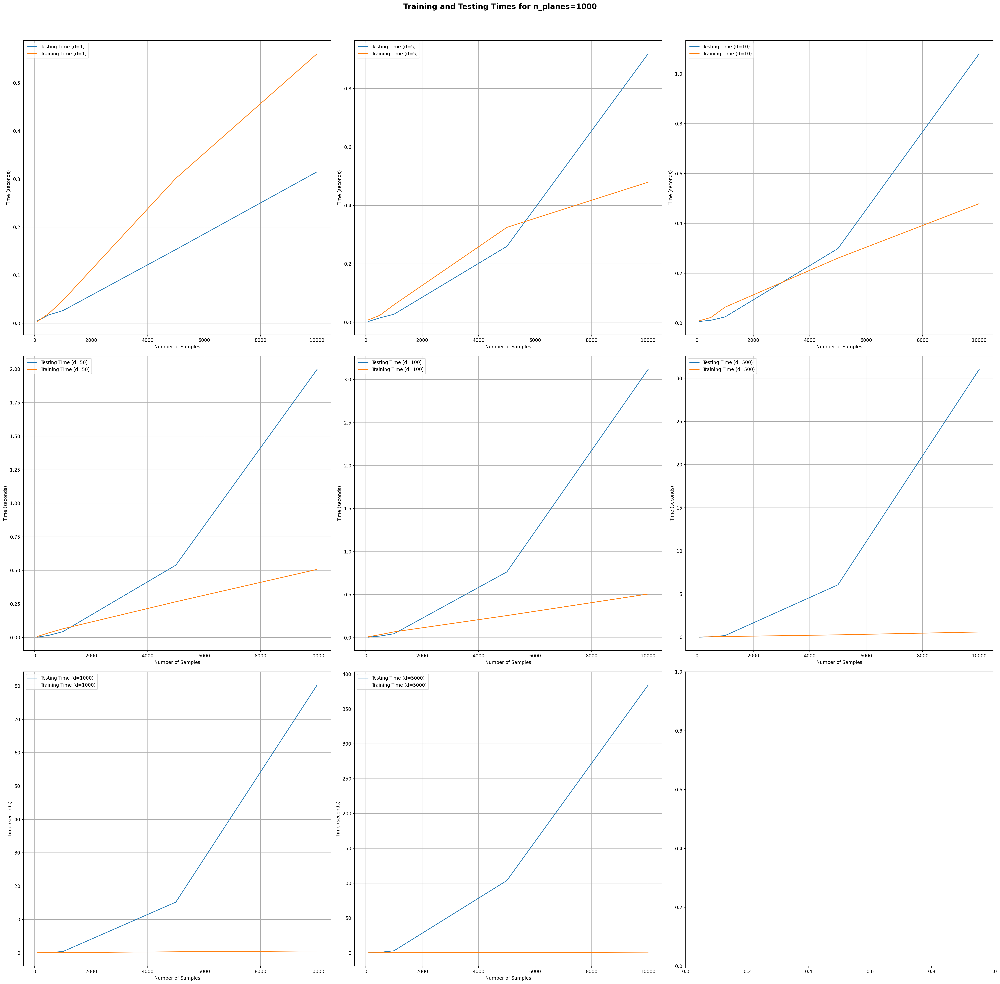

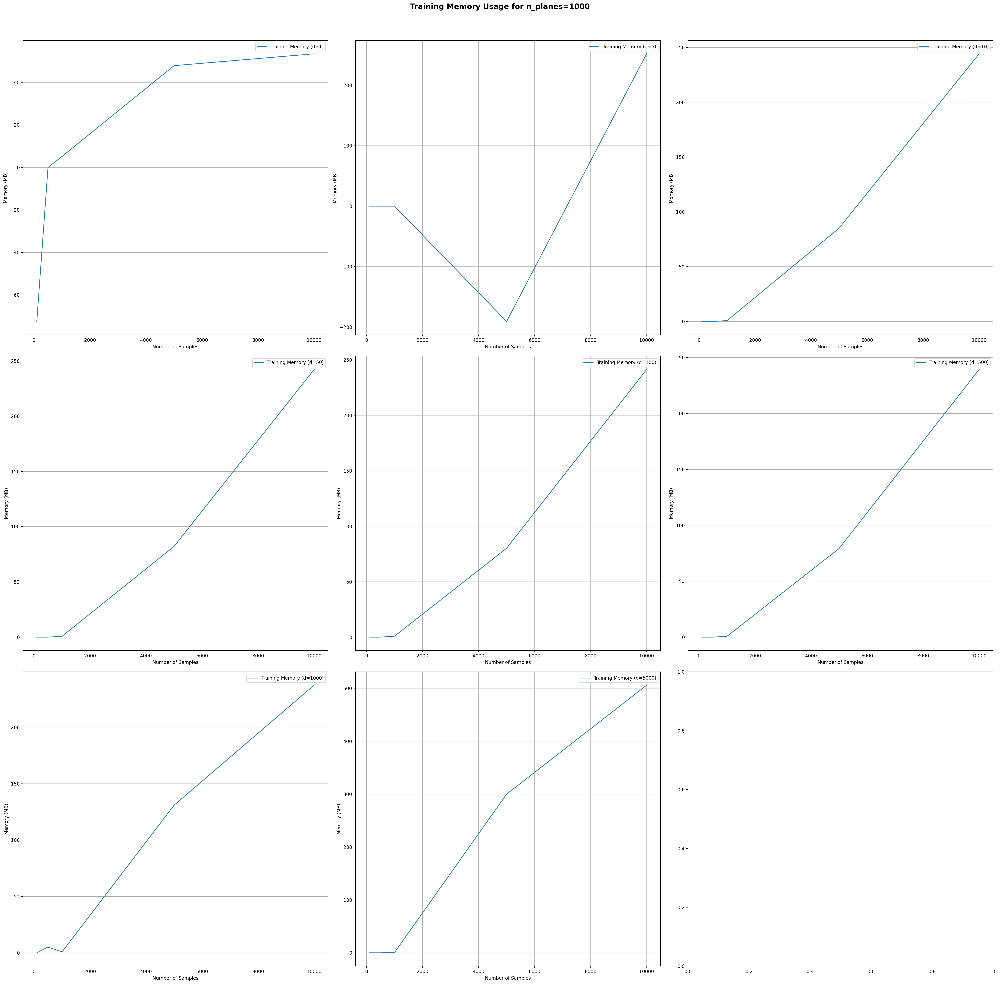

In [ ]:
import time
from memory_profiler import memory_usage
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

def time_memory(func, *args, **kwargs):
    mem_before = memory_usage()[0]
    start_time = time.time()
    result = func(*args, **kwargs)
    time_elapsed = time.time() - start_time
    memory_used = memory_usage()[0] - mem_before
    return result, time_elapsed, memory_used

for n_plane in n_planes:
    test_time_LSH, train_time_LSH, train_memory_LSH = {}, {}, {}

    for d in d_values:
        temp_train_time_LSH, temp_test_time, temp_train_memory = [], [], []

        for n_sample in n_samples:
            X_train, X_test, y_train, y_test = createDataset(
                noise=1, d=d, n_clusters=10, test_size=0.3, n_samples=n_sample, random_state=30
            )

            lsh = LSH(n_planes=n_plane)

            _, fit_time, fit_memory = time_memory(lsh.fit, X_train, y_train)
            preds, predict_time, _ = time_memory(lsh.predict, X_test)
            accuracy = accuracy_score(y_test, preds)

            temp_train_time_LSH.append(fit_time)
            temp_test_time.append(predict_time)
            temp_train_memory.append(fit_memory)

            print(f"planes={n_plane}\td={d}\tsamples={n_sample}\t"
                  f"Training Time: {fit_time:.4f} s\t Querying Time: {predict_time:.4f} s\t Accuracy: {accuracy:.4f}")

        test_time_LSH[d] = temp_test_time
        train_time_LSH[d] = temp_train_time_LSH
        train_memory_LSH[d] = temp_train_memory

    fig, axes = plt.subplots((len(d_values) + 2) // 3, 3, figsize=(30, 30))
    axes = axes.flatten()

    for i, d in enumerate(d_values):
        ax = axes[i]
        ax.plot(n_samples, test_time_LSH[d], label=f'Testing Time (d={d})')
        ax.plot(n_samples, train_time_LSH[d], label=f'Training Time (d={d})')
        ax.set_xlabel("Number of Samples")
        ax.set_ylabel("Time (seconds)")
        ax.grid(True)
        ax.legend()

    plt.suptitle(f"Training and Testing Times for n_planes={n_plane}", fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

    fig, axes = plt.subplots((len(d_values) + 2) // 3, 3, figsize=(30, 30))
    axes = axes.flatten()

    for i, d in enumerate(d_values):
        ax = axes[i]
        ax.plot(n_samples, train_memory_LSH[d], label=f'Training Memory (d={d})')
        ax.set_xlabel("Number of Samples")
        ax.set_ylabel("Memory (MB)")
        ax.grid(True)
        ax.legend()

    plt.suptitle(f"Training Memory Usage for n_planes={n_plane}", fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


### Visualization2.0

### Visualising the approxiamtions

In [6]:
X_train,X_test,y_train,y_test = createDataset(noise=1,d=2,n_clusters=3,test_size=0.3,n_samples=200,random_state = 30)

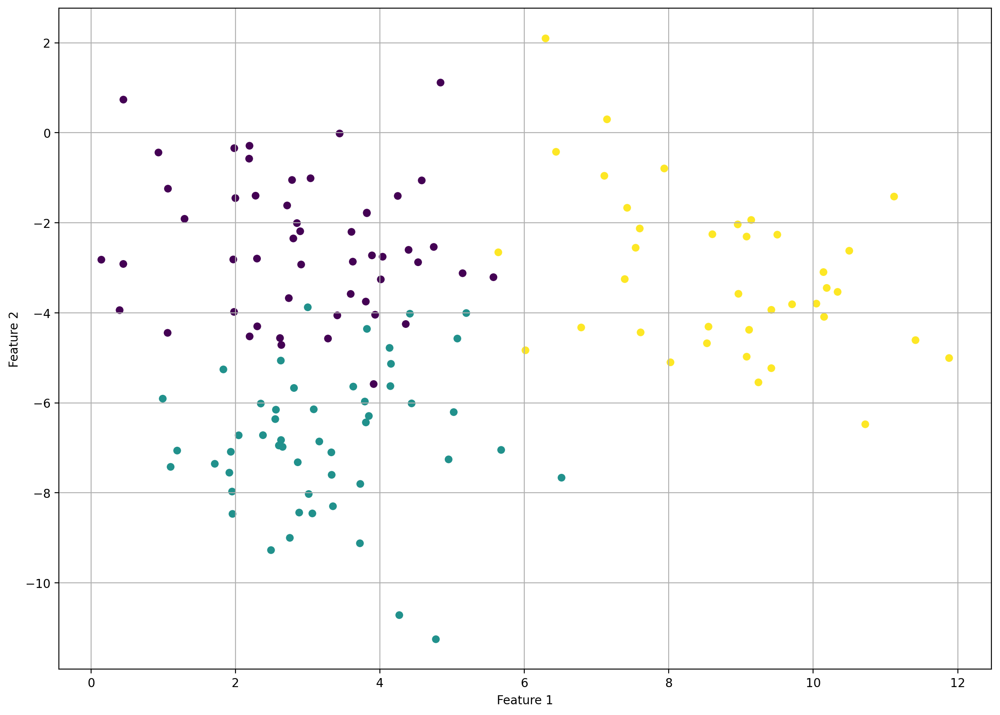

In [51]:
plt.figure(figsize=(14,10))
plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train,cmap='viridis', s=30)
plt.grid()
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()

In [54]:
query = np.array([5.5,-4.0])

[[ 5.1964985  -4.00438393]
 [ 5.07296587 -4.57122955]
 [ 5.57261243 -3.20806928]]
[1 1 0]


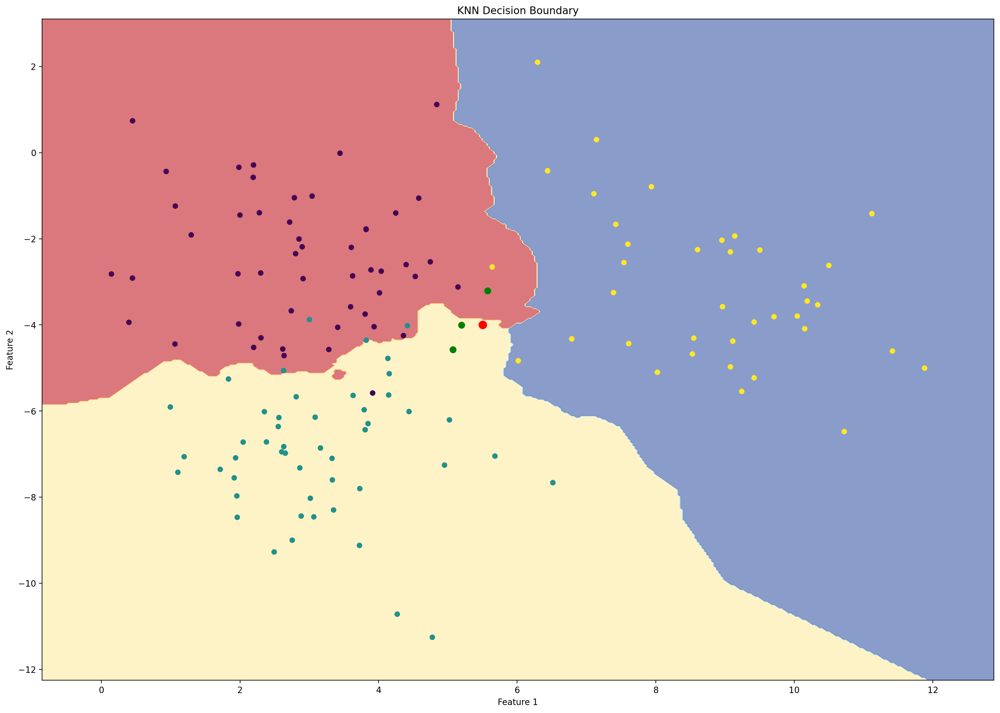

In [46]:
import numpy as np
import matplotlib.pyplot as plt

# Create a mesh grid of points
x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 400), np.linspace(y_min, y_max, 400))

# Flatten the grid to pass to the classifier
grid_points = np.c_[xx.ravel(), yy.ravel()]

# Train the KNN classifier
knn_naive = KNN_naive()
knn_naive.fit(X_train, y_train)

# Predict for all grid points
preds = knn_naive.predict(grid_points)

# Reshape the predictions back to the shape of the mesh grid
preds = preds.reshape(xx.shape)

pred_query = knn_naive.predict(query)
neighbours, y_labels = knn_naive.neighbours(query)
print(neighbours)
print(y_labels)



plt.figure(figsize=(20,14))
# Plot the decision boundary
plt.contourf(xx, yy, preds, alpha=0.6, cmap=plt.cm.RdYlBu)

# Plot the training points
plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap='viridis', s=30)

plt.scatter(neighbours[:,0],neighbours[:,1],s=50,c='green')
plt.scatter(query[0],query[1],c='red',s=80)
plt.title("KNN Decision Boundary")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()


[[ 5.1964985  -4.00438393]
 [ 5.07296587 -4.57122955]
 [ 4.41601646 -4.01889375]]
[1 1 1]


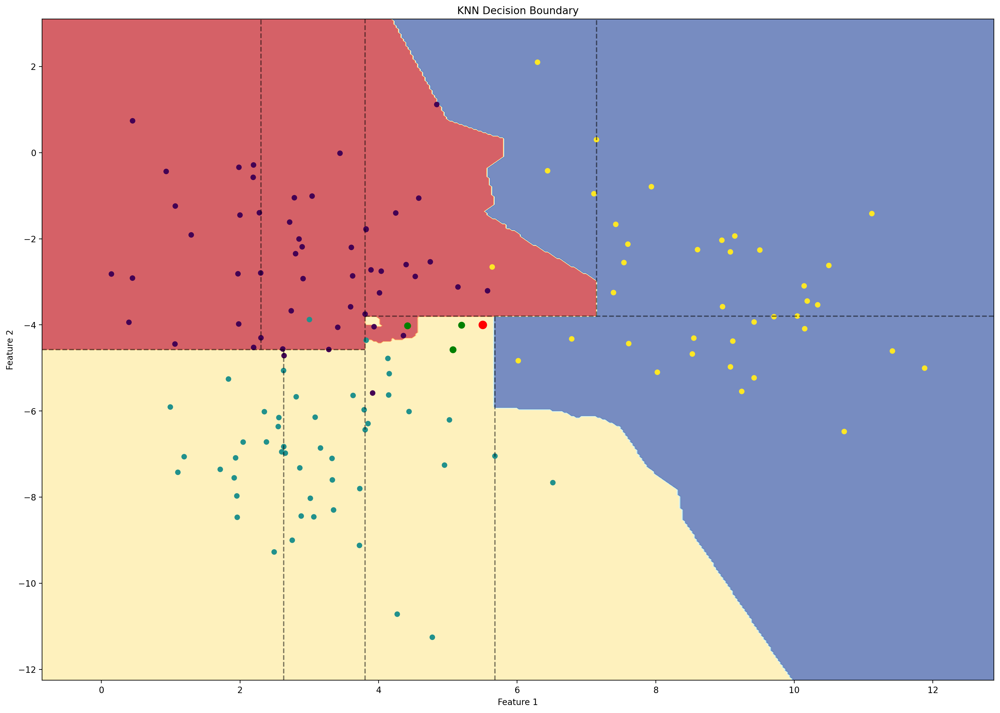

In [88]:
import numpy as np
import matplotlib.pyplot as plt

# Create a mesh grid of points
x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 400), np.linspace(y_min, y_max, 400))

# Flatten the grid to pass to the classifier
grid_points = np.c_[xx.ravel(), yy.ravel()]

# Train the KNN classifier
knn_kd = KNN_KD()
knn_kd.fit(X_train, y_train)
# print(grid_points)

# Predict for all grid points
preds = knn_kd.predict(grid_points)

# Reshape the predictions back to the shape of the mesh grid
preds = preds.reshape(xx.shape)

# pred_query = knn_kd.predict(query)
neighbours, y_labels = knn_kd.neighbours(knn_kd.tree.tree,query)
print(neighbours)
print(y_labels)


def plot_classifier_lines(node, x_start, x_end, y_start, y_end, axis=0):
    if node.left is None and node.right is None:
        return
    if axis == 0:
        plt.plot([node.value, node.value], [y_start, y_end],c='black',alpha=0.5,linestyle='--')
        plot_classifier_lines(node.left, x_start, node.value, y_start, y_end, axis=(axis + 1) % 2)
        plot_classifier_lines(node.right, node.value, x_end, y_start, y_end, axis=(axis + 1) % 2)
        
    else:
        plt.plot([x_start, x_end], [node.value, node.value],c='black',alpha=0.5,linestyle='--')
        plot_classifier_lines(node.left, x_start, x_end, y_start, node.value, axis=(axis + 1) % 2)
        plot_classifier_lines(node.right, x_start, x_end, node.value, y_end, axis=(axis + 1) % 2)
    
    
plt.figure(figsize=(20,14))

# Plot the decision boundary
plt.contourf(xx, yy, preds, alpha=0.7, cmap=plt.cm.RdYlBu)

# Plot the training points
plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap='viridis', s=30)

plot_classifier_lines(knn_kd.tree.tree,x_min,x_max,y_min,y_max)
plt.scatter(neighbours[:,0],neighbours[:,1],s=50,c='green')
plt.scatter(query[0],query[1],c='red',s=80)

plt.title("KNN Decision Boundary")
plt.xlim(x_min,x_max)
plt.ylim(y_min,y_max)
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()


[[ 1.          5.57261243 -3.20806928]
 [ 1.          5.14567919 -3.11958113]
 [ 1.          6.78747144 -4.32511448]]
[0 0 2]


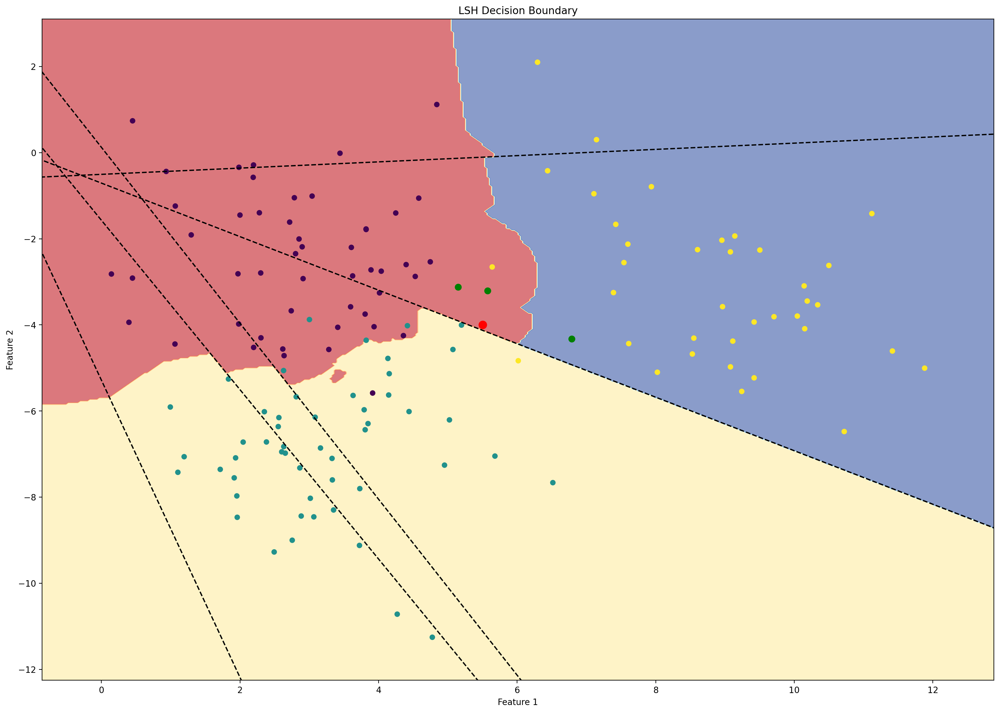

In [77]:
import numpy as np
import matplotlib.pyplot as plt


# Create a mesh grid of points
x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 400), np.linspace(y_min, y_max, 400))

# Flatten the grid to pass to the classifier
grid_points = np.c_[xx.ravel(), yy.ravel()]
# grid_points_line = np.c_[np.array(1),xx.ravel(), yy.ravel()]

# Train the KNN classifier
planes = 5
lsh = LSH(n_planes=planes,mean=8,std=5)
lsh.fit(X_train, y_train)

# Predict for all grid points
preds = lsh.predict(grid_points)

# Reshape the predictions back to the shape of the mesh grid
preds = preds.reshape(xx.shape)


# pred_query = lsh.predict(query)
neighbours, y_labels = lsh.neighbours(query)
print(neighbours)
print(y_labels)


plt.figure(figsize=(20,14))

weights = lsh.weights
for i in range(planes):
    b1, w1, w2 = weights[:,i]
    x1_values = np.linspace(-100, 100, 400)
    x2_values = - (w1 / w2) * x1_values - (b1 / w2)
    plt.plot(x1_values, x2_values,c="black",linestyle='--')


# Plot the decision boundary
plt.contourf(xx, yy, preds, alpha=0.6, cmap=plt.cm.RdYlBu)

# Plot the training points
plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap='viridis', s=30)

plt.scatter(neighbours[:,1],neighbours[:,2],s=50,c='green')
plt.scatter(query[0],query[1],c='red',s=80)

plt.title("LSH Decision Boundary")
plt.xlim(x_min,x_max)
plt.ylim(y_min,y_max)
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()


